<a href="https://colab.research.google.com/github/uoahep/DY_boundingbox/blob/main/obj_detection_bounding_box.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
# 모델 다운로드
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17496, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 17496 (delta 2), reused 0 (delta 0), pack-reused 17491 (from 3)
Receiving objects: 100% (17496/17496), 16.59 MiB | 22.56 MiB/s, done.
Resolving deltas: 100% (11993/11993), done.


In [5]:
%cd yolov5
!pip install -r requirements.txt
# 사전 학습된 파라미터 다운로드
!wget https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5s.pt
!pwdyolov5

/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 77.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 62.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 41.1 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
  

In [6]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab import files
uploaded = files.upload()


Saving desk.jpg to desk.jpg


In [7]:
import io
from PIL import Image
import torch

device = '0' if torch.cuda.is_available() else 'cpu'
filename = next(iter(uploaded))
img = Image.open("desk.jpg")

In [8]:
model = torch.hub.load('.', 'custom', path='yolov5s.pt', source='local', device=device)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 v7.0-421-g79c4c31d Python-3.11.13 torch-2.6.0+cu124 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [9]:
results = model(img)

/content/yolov5/models/common.py:906: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


image 1/1: 2955x3928 1 cup, 1 keyboard, 1 clock, 1 scissors
Speed: 220.8ms pre-process, 563.6ms inference, 35.5ms NMS per image at shape (1, 3, 512, 640)


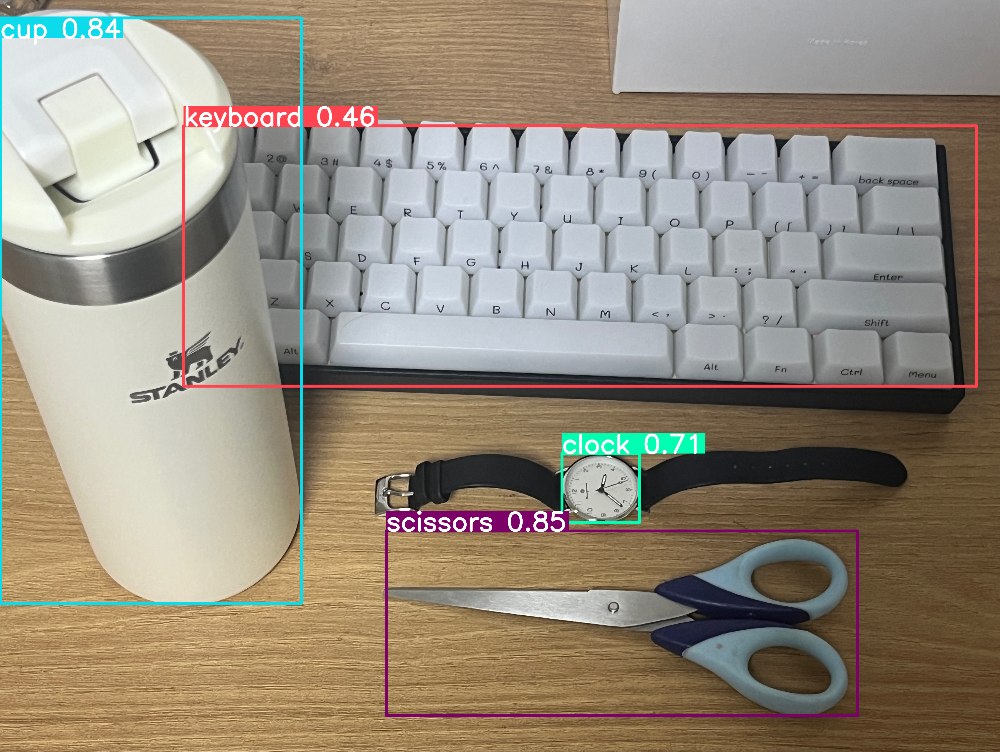

,xmin,ymin,xmax,ymax,confidence,class,name
0,1517.739624,2086.919189,3368.868408,2812.635254,0.854899,76,scissors
1,1.659773,70.301689,1183.378662,2370.750244,0.837245,41,cup
2,2207.898193,1781.597534,2511.639893,2053.727295,0.707732,74,clock
3,721.294678,494.741058,3835.787842,1517.865845,0.462617,66,keyboard


In [10]:
results.print()  # 탐지된 객체 정보 출력
results.show()   # 탐지 결과 이미지 표시
results.pandas().xyxy[0]